# From Quality control to Clustering for day 5 samples

package loading

In [1]:
library(ggplot2)
library(cowplot)
library(dplyr)
library(tibble)
library(AnnotationHub)
library(patchwork)
library(Seurat)
library(harmony)
library(magrittr)
library(SeuratWrappers)
library(gprofiler2)


Attachement du package : ‘dplyr’


Les objets suivants sont masqués depuis ‘package:stats’:

    filter, lag


Les objets suivants sont masqués depuis ‘package:base’:

    intersect, setdiff, setequal, union


Le chargement a nécessité le package : BiocGenerics


Attachement du package : ‘BiocGenerics’


Les objets suivants sont masqués depuis ‘package:dplyr’:

    combine, intersect, setdiff, union


Les objets suivants sont masqués depuis ‘package:stats’:

    IQR, mad, sd, var, xtabs


Les objets suivants sont masqués depuis ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Le chargement a nécessité le package : BiocFile

Definitions of colors pallet

In [2]:
custom_colors <- list()

colors_dutch <- c(
  '#FFC312','#C4E538','#12CBC4','#FDA7DF','#ED4C67',
  '#F79F1F','#A3CB38','#1289A7','#D980FA','#B53471',
  '#EE5A24','#009432','#0652DD','#9980FA','#833471',
  '#EA2027','#006266','#1B1464','#5758BB','#6F1E51'
)

colors_spanish <- c(
  '#40407a','#706fd3','#f7f1e3','#34ace0','#33d9b2',
  '#2c2c54','#474787','#aaa69d','#227093','#218c74',
  '#ff5252','#ff793f','#d1ccc0','#ffb142','#ffda79',
  '#b33939','#cd6133','#84817a','#cc8e35','#ccae62',
  '#45aaf2', '#7f8c8d'
)

colors_turkish <- c(
  '#cd84f1','#ffcccc','#ff4d4d','#ffaf40','#fffa65',
  '#32ff7e','#7efff5','#18dcff','#7d5fff','#4b4b4b'
)

custom_colors$discrete <- c(colors_dutch, colors_spanish, colors_turkish)

custom_colors$cell_cycle <- setNames(
  c('#45aaf2', '#f1c40f', '#e74c3c', '#7f8c8d'),
  c('G1',      'S',       'G2M',     '-')
)

plot resolution

In [3]:
options(repr.plot.width = 18, repr.plot.height = 17, repr.plot.pointsize = 24)

In [4]:
library(future)

In [5]:
plan("multicore", workers = 8)
plan()

multicore:
- args: function (..., workers = 8, envir = parent.frame())
- tweaked: TRUE
- call: plan("multicore", workers = 8)

Loading of the cell ranger matrix

In [6]:
embryo <- readRDS("/home/adufour/work/rds_storage/gastrulation/embryo_E5_E15.rds")

In [7]:
options(future.globals.maxSize = 6000 * 1024^2, future.seed=TRUE)

Normalization, selection of varibale feature, scaling, PCA and batch correction

In [8]:
embryo <- NormalizeData(embryo) %>% FindVariableFeatures(nfeatures = 3000) %>% ScaleData() %>% RunPCA(npcs = 100, verbose = FALSE)

Centering and scaling data matrix



In [9]:
tiny_numbers <- seq(.01,.02, by = .0001)
rounded_number = round(tiny_numbers/.002)*.002

In [10]:
embryo@meta.data <- embryo@meta.data[,c('Sample', 'Stage', 'Celltypes')]

In [11]:
embryo@meta.data$origin <- "0"

In [12]:
embryo@meta.data[which(embryo@meta.data$Stage == "E5"),]$origin <- "preg"
embryo@meta.data[which(embryo@meta.data$Stage == "E7"),]$origin <- "preg"
embryo@meta.data[which(embryo@meta.data$Stage == "E9"),]$origin <- "preg"
embryo@meta.data[which(embryo@meta.data$Stage == "E11"),]$origin <- "preg"

embryo@meta.data[which(embryo@meta.data$Stage == "E11.5"),]$origin <- "gast"
embryo@meta.data[which(embryo@meta.data$Stage == "E12"),]$origin <- "gast"
embryo@meta.data[which(embryo@meta.data$Stage == "E12.5"),]$origin <- "gast"
embryo@meta.data[which(embryo@meta.data$Stage == "E13"),]$origin <- "gast"
embryo@meta.data[which(embryo@meta.data$Stage == "E13.5"),]$origin <- "gast"
embryo@meta.data[which(embryo@meta.data$Stage == "E14"),]$origin <- "gast"
embryo@meta.data[which(embryo@meta.data$Stage == "E14.5"),]$origin <- "gast"
embryo@meta.data[which(embryo@meta.data$Stage == "E15"),]$origin <- "gast"

In [13]:
embryo.integrated <- RunHarmony(embryo,
                                #kmeans_init_nstart=50,
                                #max.iter.cluster = 100,
                                #kmeans_init_iter_max=10000,
                                #theta = 0, 
                                #lambda = 0.9,
                                #sigma = 0.1,
                                group.by.vars = c("Sample"))

Warning message:
“Les étapes de transfer (quick-TRANSfer stage) ont dépassé le maximum (= 6303500)”
Warning message:
“Les étapes de transfer (quick-TRANSfer stage) ont dépassé le maximum (= 6303500)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity”


Generating artifical doublet

# Filtering data based on quality controls metrics

Warning message:
“Transformation introduced infinite values in continuous x-axis”


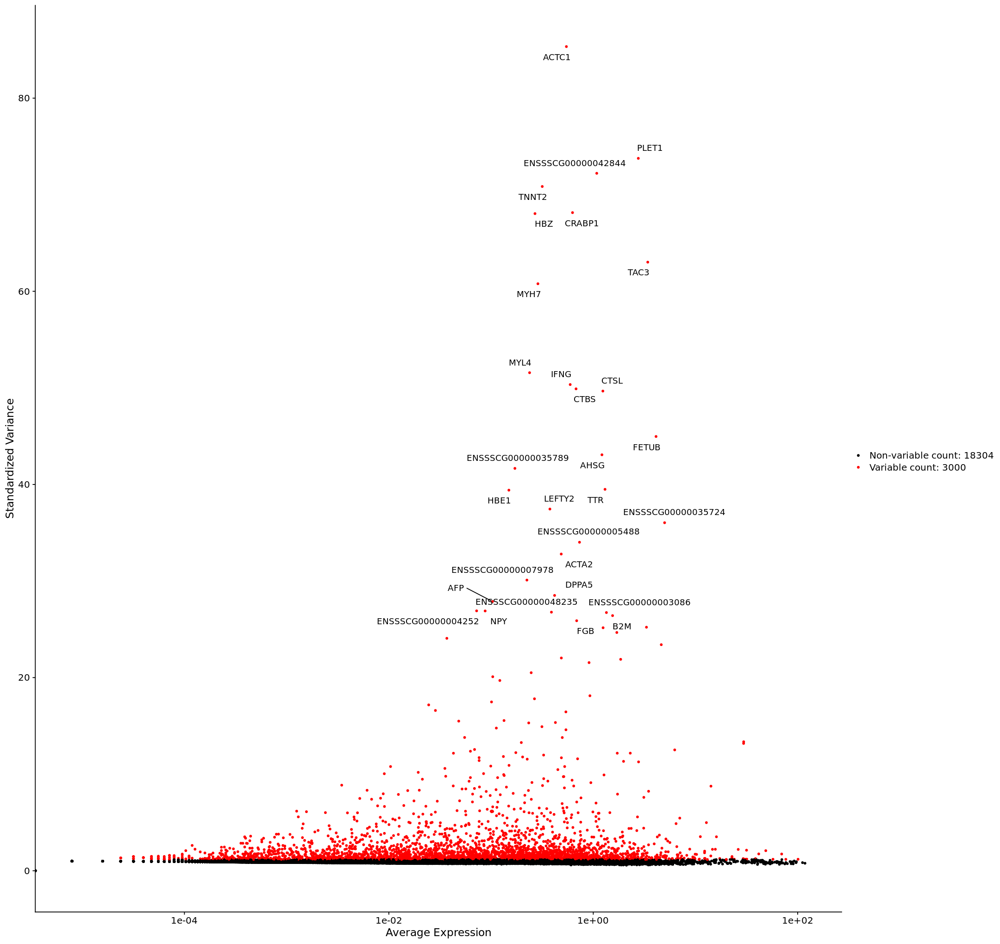

In [10]:
topfeature <- head(VariableFeatures(embryo.integrated), 30)
plotfeature <- VariableFeaturePlot(embryo.integrated)
LabelPoints(plot = plotfeature, points = topfeature, repel = TRUE, xnudge = 0, ynudge = 0, max.overlaps = 30)

# Visualization fo the different principal composant

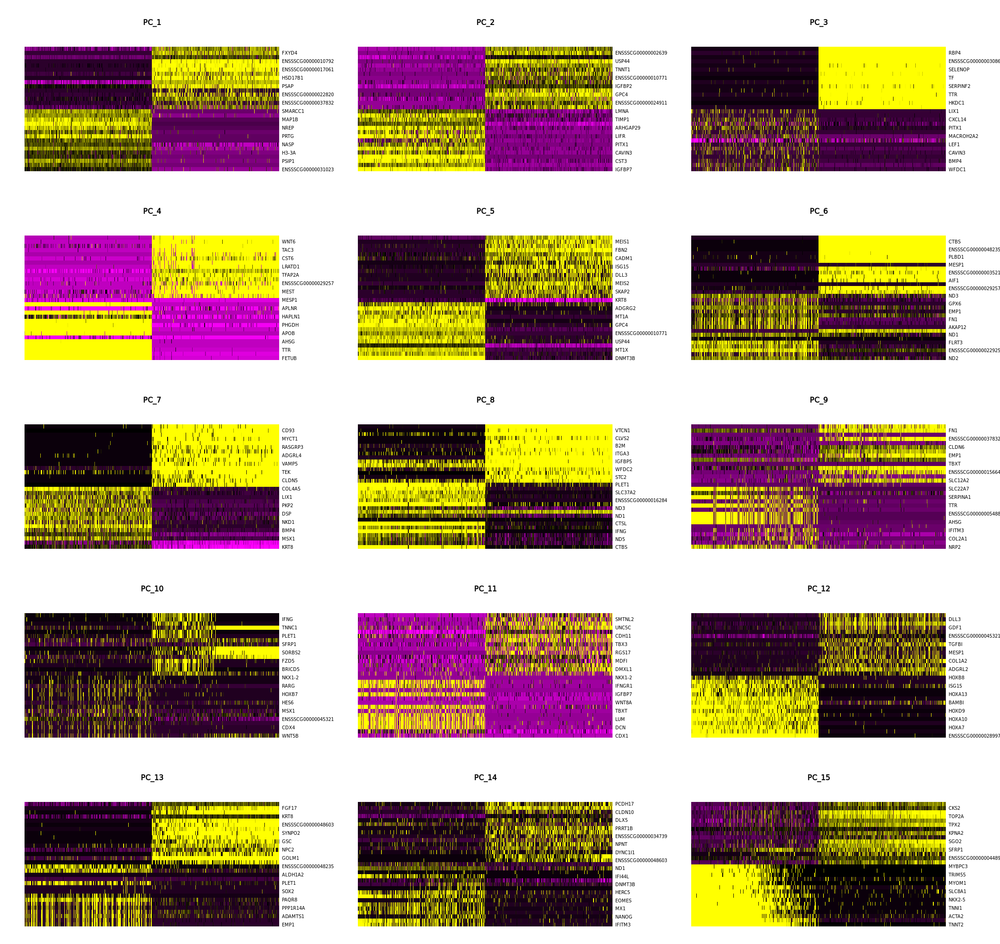

In [11]:
DimHeatmap(embryo.integrated, dims = 1:15, cells = 1000, balanced = TRUE)

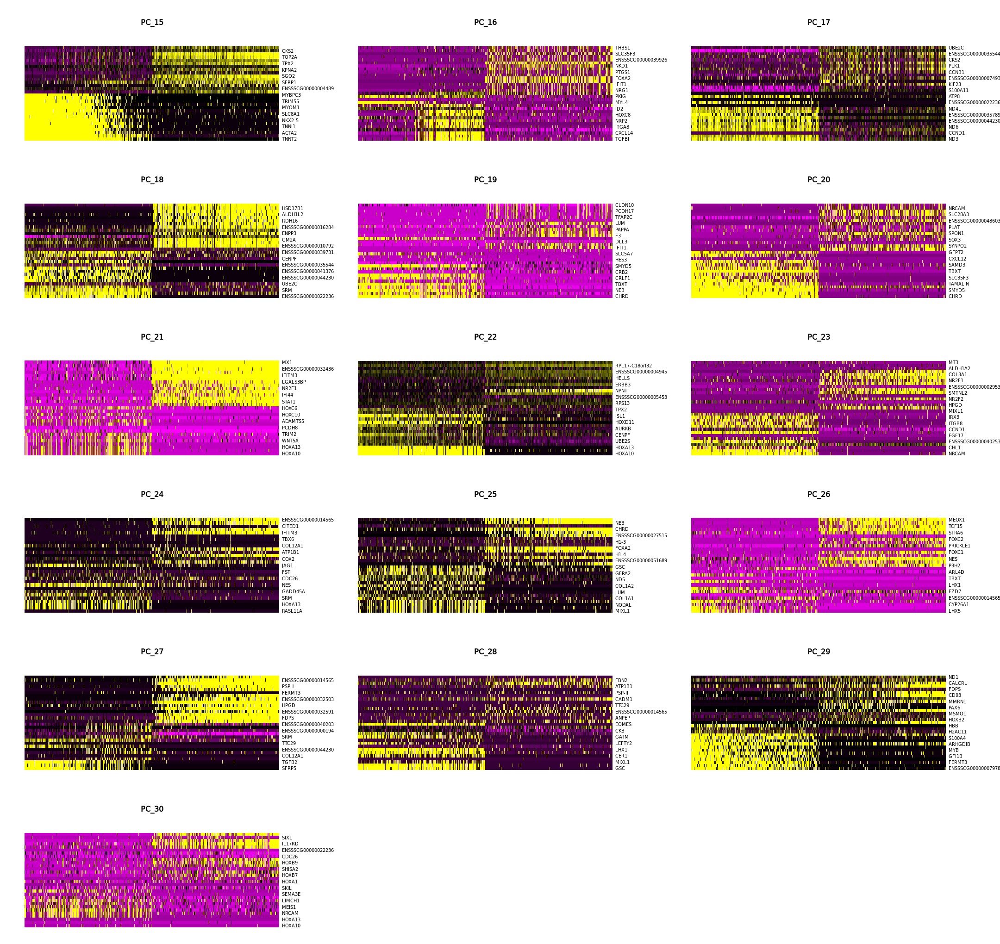

In [12]:
DimHeatmap(embryo.integrated, dims = 15:30, cells = 1000, balanced = TRUE)

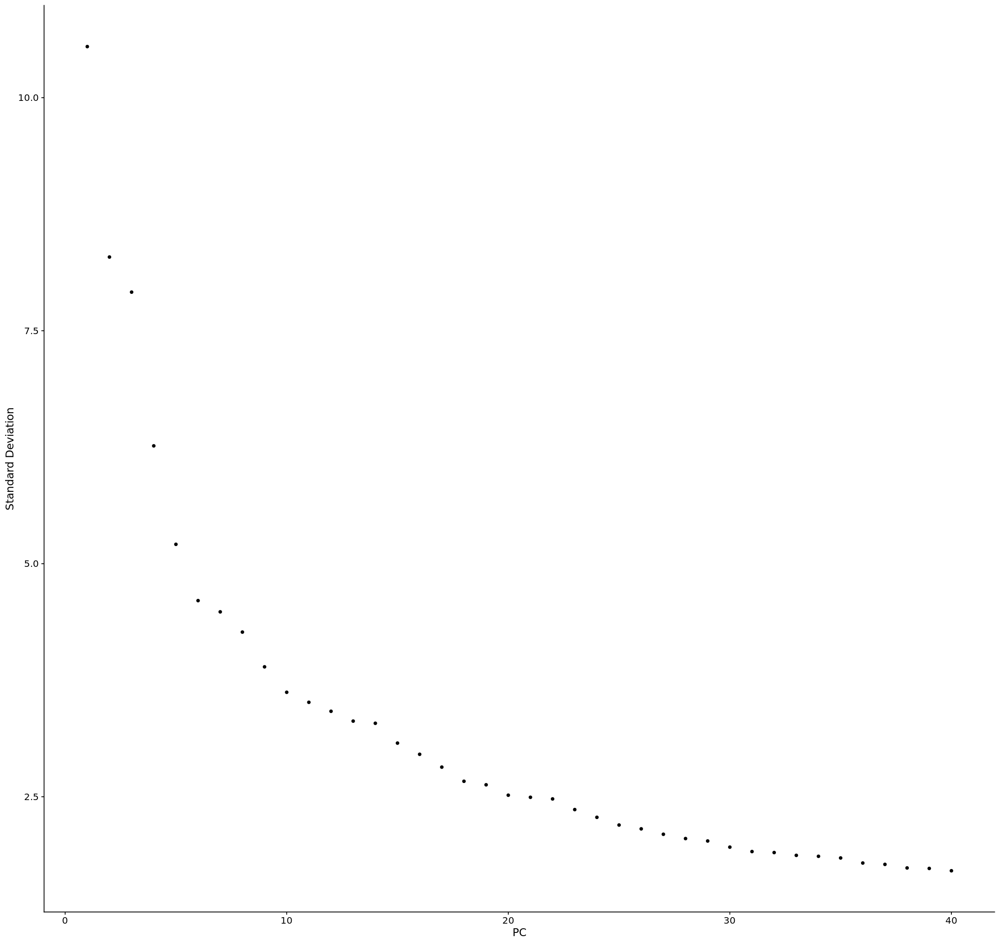

In [11]:
ElbowPlot(embryo.integrated, ndims = 40)

# Vizualization and clustering

In [14]:
embryo.integrated <- RunUMAP(embryo.integrated,
                             dims = 1:35,
                             min.dist = 0.5,
                             n.neighbors = 50L,
                             reduction = "harmony"
                            )

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
16:07:14 UMAP embedding parameters a = 0.583 b = 1.334

16:07:15 Read 126070 rows and found 35 numeric columns

16:07:15 Using Annoy for neighbor search, n_neighbors = 50

16:07:15 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:07:27 Writing NN index file to temp file /tmp/Rtmp2EP6OK/file363b5e5aaa10fd

16:07:27 Searching Annoy index using 8 threads, search_k = 5000

16:08:01 Annoy recall = 100%

16:08:02 Commencing smooth kNN distance calibration using 8 threads
 with target n_neighb

In [15]:
embryo.integrated <- FindNeighbors(embryo.integrated,
                                   reduction = "harmony",
                                   dims = 1:35)

Computing nearest neighbor graph

Computing SNN



In [16]:
embryo.integrated <- FindClusters(embryo.integrated, resolution = 2.3)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 126070
Number of edges: 4564316

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8445
Number of communities: 52
Elapsed time: 59 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


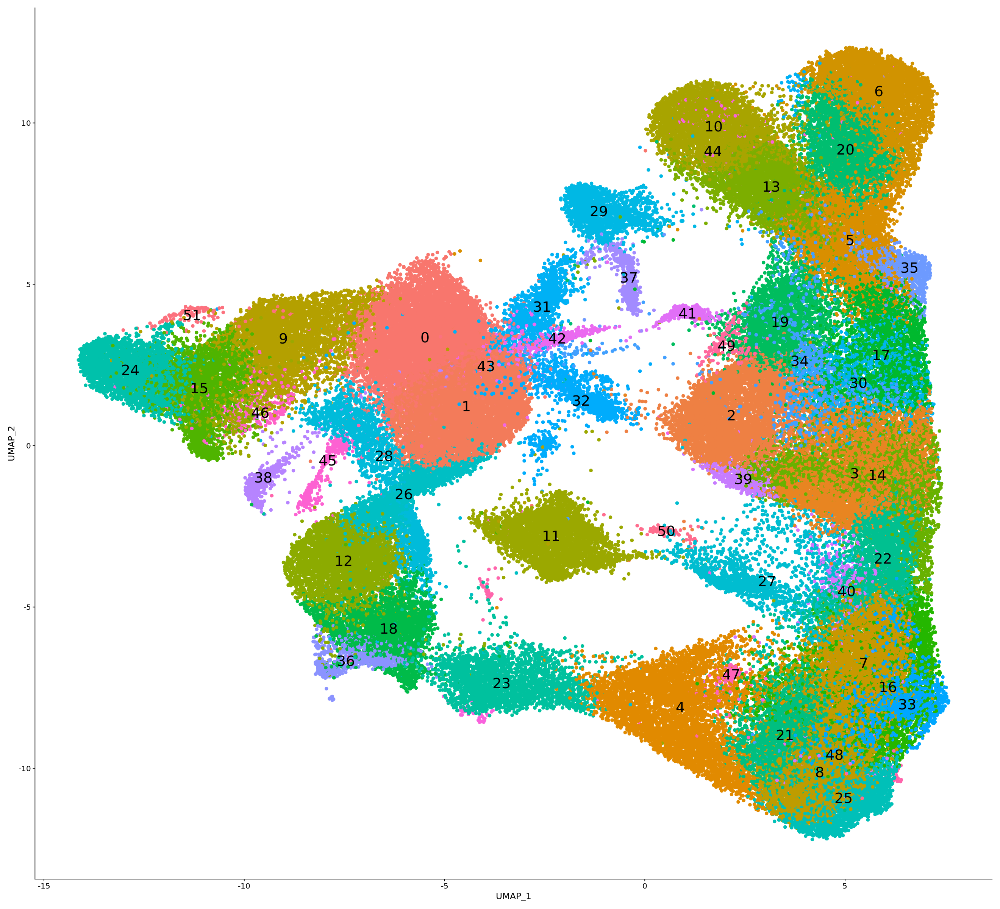

In [17]:
Idents(object = embryo.integrated) <- "seurat_clusters"
options(repr.plot.width = 22, repr.plot.height = 20, repr.plot.pointsize = 24)
DimPlot(embryo.integrated, reduction = "umap", pt.size = 2, label = TRUE, label.size = 8, raster=FALSE) + theme(legend.position = "none")

In [15]:
color_list <- c('ICM' = '#FFC312', 'TE Ea' = '#C4E538', 'TE In1' = '#12CBC4', 'HYPO In' = '#FDA7DF', 'HYPO Ma' = '#ED4C67', 'Epiblast' = '#FFC312', 'TE In2' = '#D980FA',
  'TE Lr' = '#6F1E51', 'HYPO Ea' = '#D980FA', 'TE Mt' = '#B53471', 'HYPO Ve' = '#EE5A24', 'TE Ma1' = '#c7ecee', 'TE Ma2' = '#FDA7DF', 'TE Il1' = '#9980FA', 
  'Mesendoderm' = '#833471', "Trophoblast" = "#3565A7", "Amnion" = "#5891BF", "Anterior Surface Ectoderm" = "#D3F1FD", "Posterior Surface Ectoderm" = "#C1DDBB",
  "Brain" = "#92CBC1", "Spinal Cord" = "#2B645E", "Epiblast 1" = "#D5BF9E", "Epiblast 2" = "#E8D6A8", "Epiblast 3" = "#F8EAB0", "Epiblast 4" = "#CAD2CE", "PGC" = "#8249B4",
  "Anterior Primitive Streak/Node" = "#FFF478", "Definitive Endoderm" = "#E6FFA6", "Gut/Hypoblast" = "#AFE76A", "Hypoblast" = "#61B62B", "ExE Endoderm" = "#327D21",
  "Primitive streak 1" = "#FFE173", "Primitive Streak 2" = "#FBAD54", "Primitive Streak 3" = "#FFCD8B", "Nascent Mesoderm 1" = "#EE7C54", "Nascent Mesoderm 2" = "#F99878",
  "Mixed Mesoderm" = "#F4192B", "Posterior Mixed mesoderm" = "#B81828", "ExE Mesoderm 1" = "#821825", "ExE Mesoderm 2" = "#A2545E", "Somitic Mesoderm" = "#F9D1EE",
  "Presomitic Mesoderm" = "#E076C5", "Pharyngeal Mesoderm 1" = "#E0057A", "Pharyngeal Mesoderm 2" = "#F3A0CC", "Intermediate Mesoderm 1" = "#ff624a", 
  "Intermediate Mesoderm 2" = "#EE71B6", "Haematoendothelial Progenitors" = "#8F4986", "Blood Progenitors" = "#590D57", "Mesenchyme 1" = "#1b0840",
  "Mesenchyme 2" = "#430707", "Mesenchyme 3" = "#724545", "Allantois" = "#AE1667", "Cardiac Mesoderm" = "#000000", "Neural Ectoderm" = "#c7d0cb",
  "Pharyngeal Mesoderm" = "#e10578", "Caudal Epiblast" = "#97c9c3", "Intermediate mesoderm 2" = "#f86cb6", "Lateral Plate Mesoderm" = "#fff676")

In [41]:
Idents(object = embryo.integrated) <- "Celltypes"
options(repr.plot.width = 22, repr.plot.height = 20, repr.plot.pointsize = 24)
plot <- DimPlot(embryo.integrated, reduction = "umap", pt.size = 2, label = FALSE, cols = color_list, label.size = 8, raster=FALSE)

In [42]:
ggsave(
  '/home/adufour/work/notebook/plots/gastrulation/all_cells_umaps_harmony.svg',
  plot, height = 25.5, width = 40.5
)

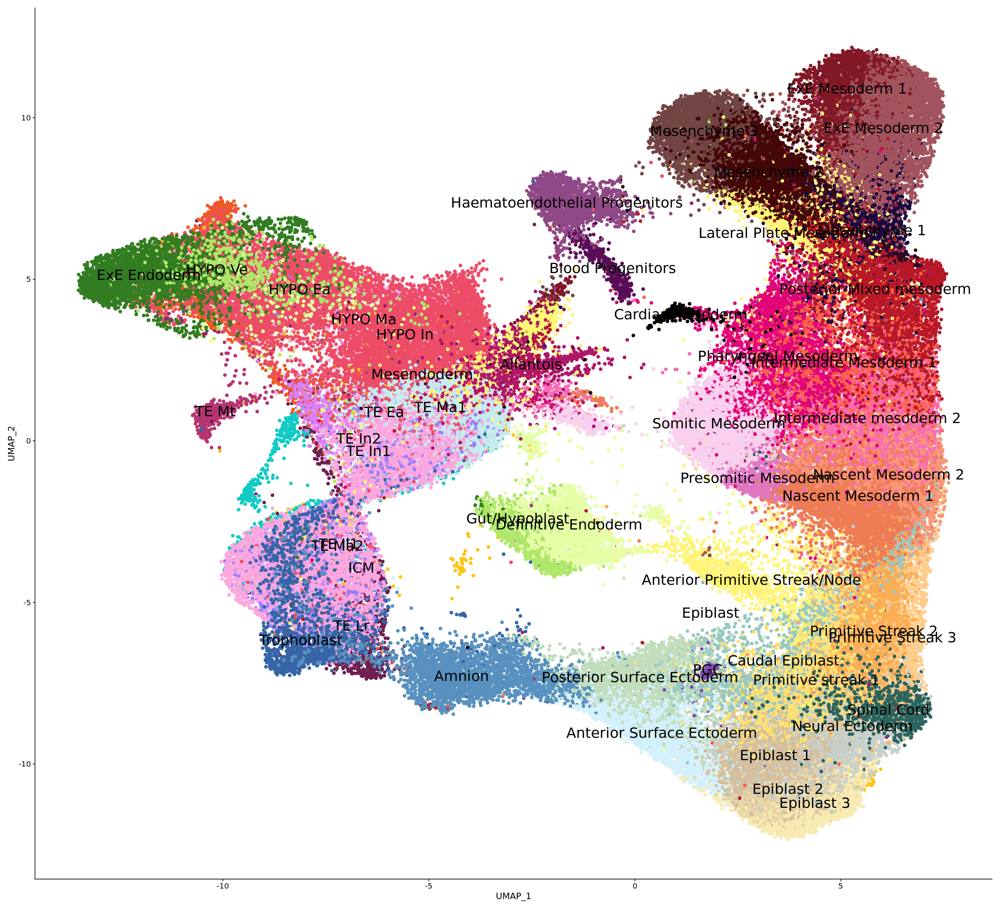

In [16]:
Idents(object = embryo.integrated) <- "Celltypes"
options(repr.plot.width = 22, repr.plot.height = 20, repr.plot.pointsize = 24)
DimPlot(embryo.integrated, reduction = "umap", pt.size = 2, label = TRUE, cols = color_list, label.size = 8, raster=FALSE) + theme(legend.position = "none")

In [66]:
saveRDS(embryo.integrated, file = "/home/adufour/work/rds_storage/gastrulation/embryo_harmony.rds")

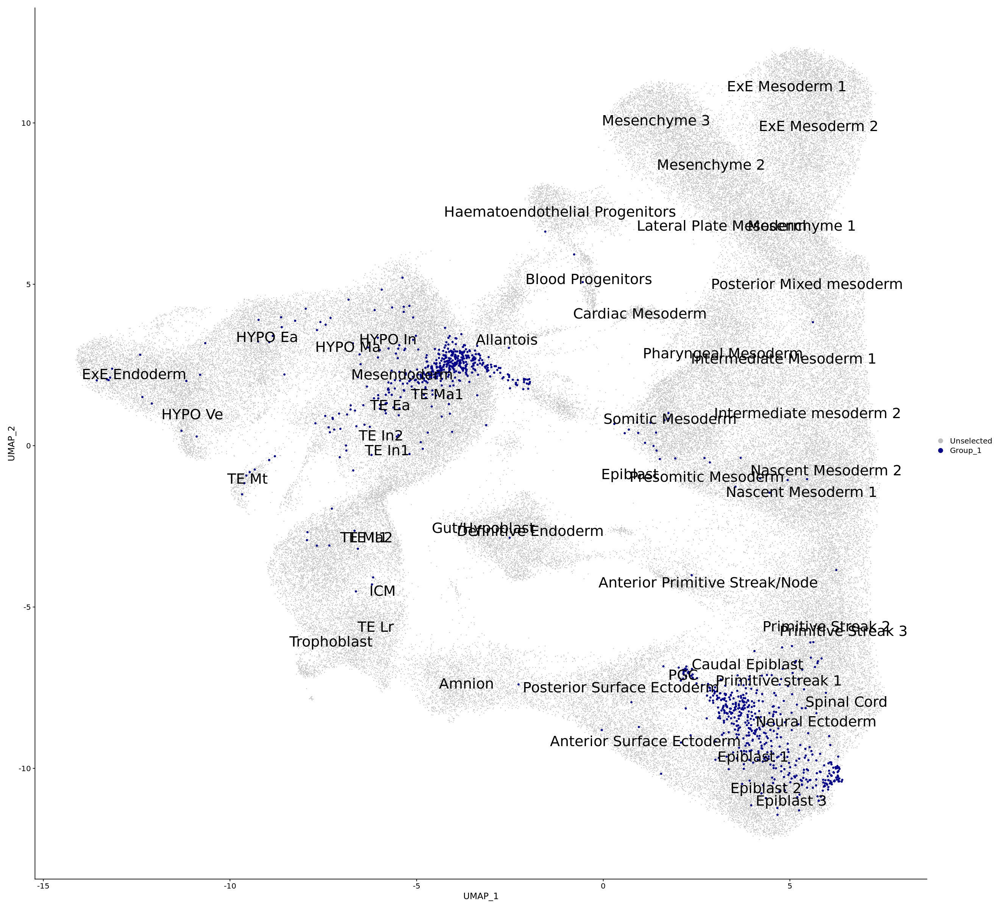

In [18]:
Idents(object = embryo.integrated) <- "Celltypes"
g1_untreat <- WhichCells(embryo.integrated, idents = c('Epiblast'))
DimPlot(embryo.integrated, label=TRUE, cells.highlight= g1_untreat, cols.highlight = c("darkblue", "darkred"), cols= "grey", label.size = 8, raster=FALSE)

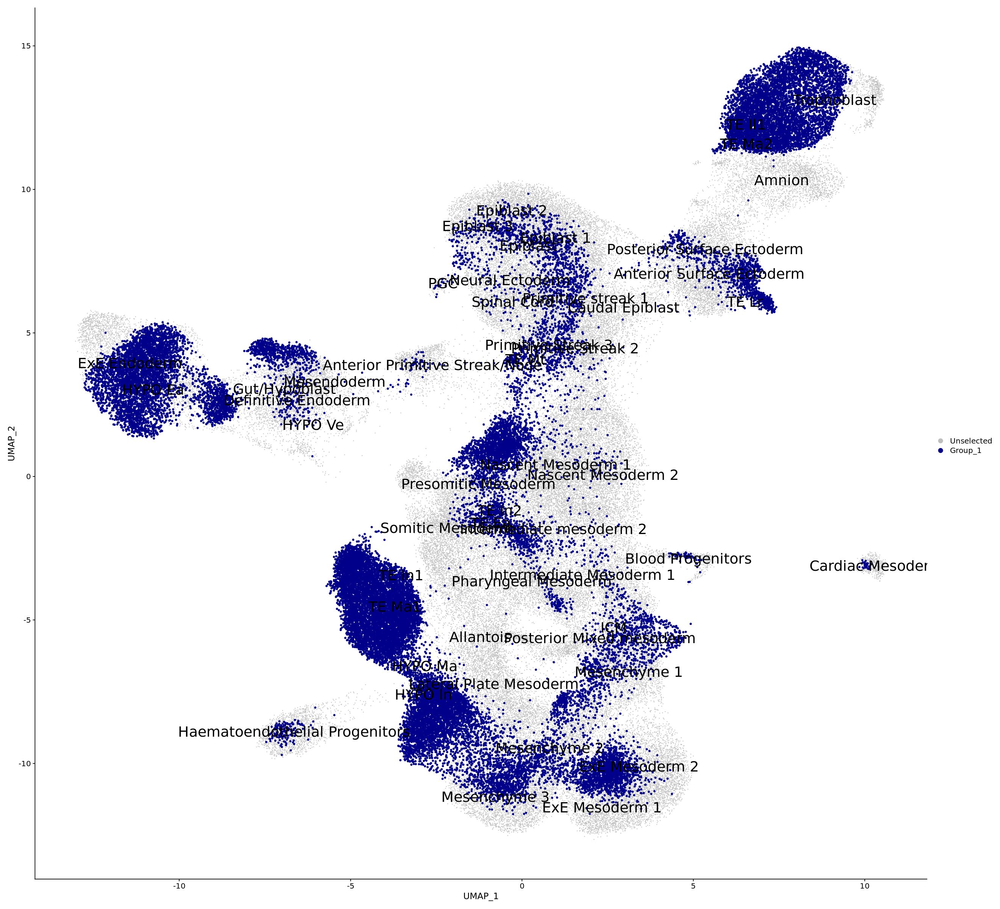

In [32]:
g1_untreat <- WhichCells(embryo.integrated, idents = c('ICM', 'TE Ea', 'TE In1', 'HYPO In', 'HYPO Ma', 'Epiblast', 'TE In2', 'TE Lr', 'HYPO Ea', 'TE Mt', 'HYPO Ve', 'TE Ma1', 'TE Ma2', 'TE Il1'))
DimPlot(embryo.integrated, label=TRUE, cells.highlight= g1_untreat, cols.highlight = c("darkblue", "darkred"), cols= "grey", label.size = 8, raster=FALSE)

Vizualization samples

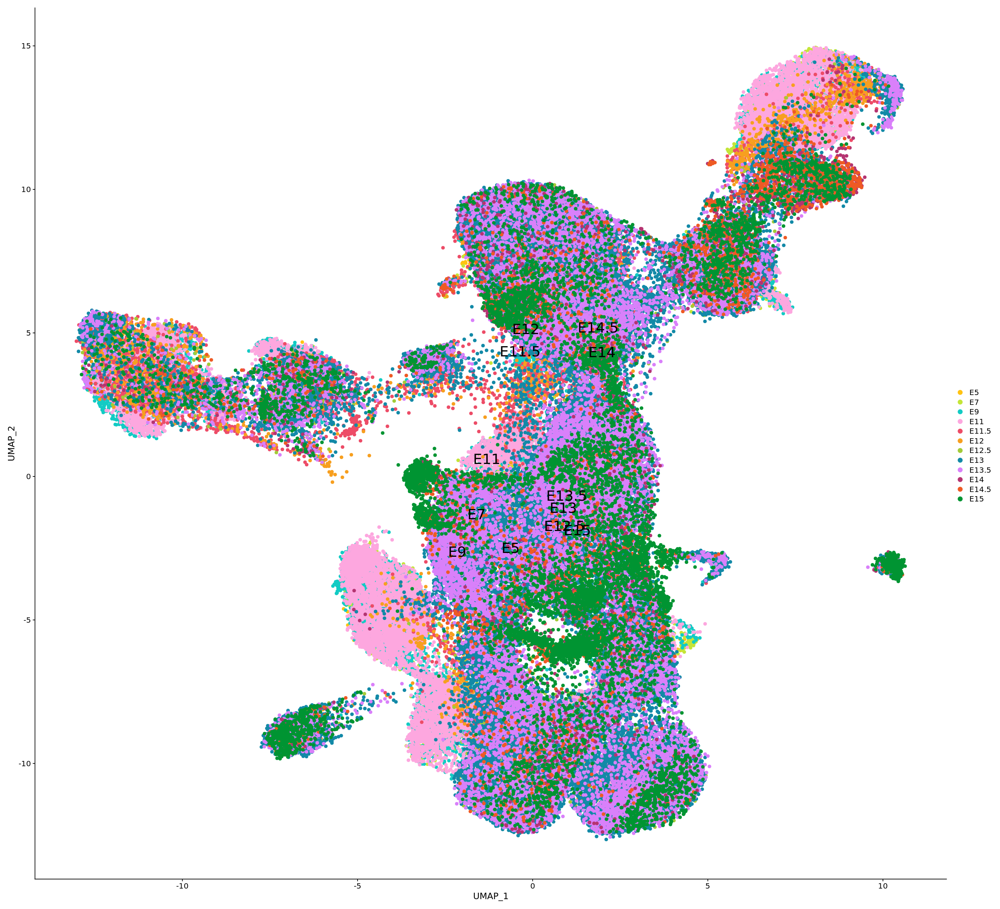

In [33]:
Idents(object = embryo.integrated) <- "Stage"
options(repr.plot.width = 22, repr.plot.height = 20, repr.plot.pointsize = 24)
DimPlot(embryo.integrated, reduction = "umap", pt.size = 2, label = TRUE, cols = custom_colors$discrete, label.size = 8, raster=FALSE)

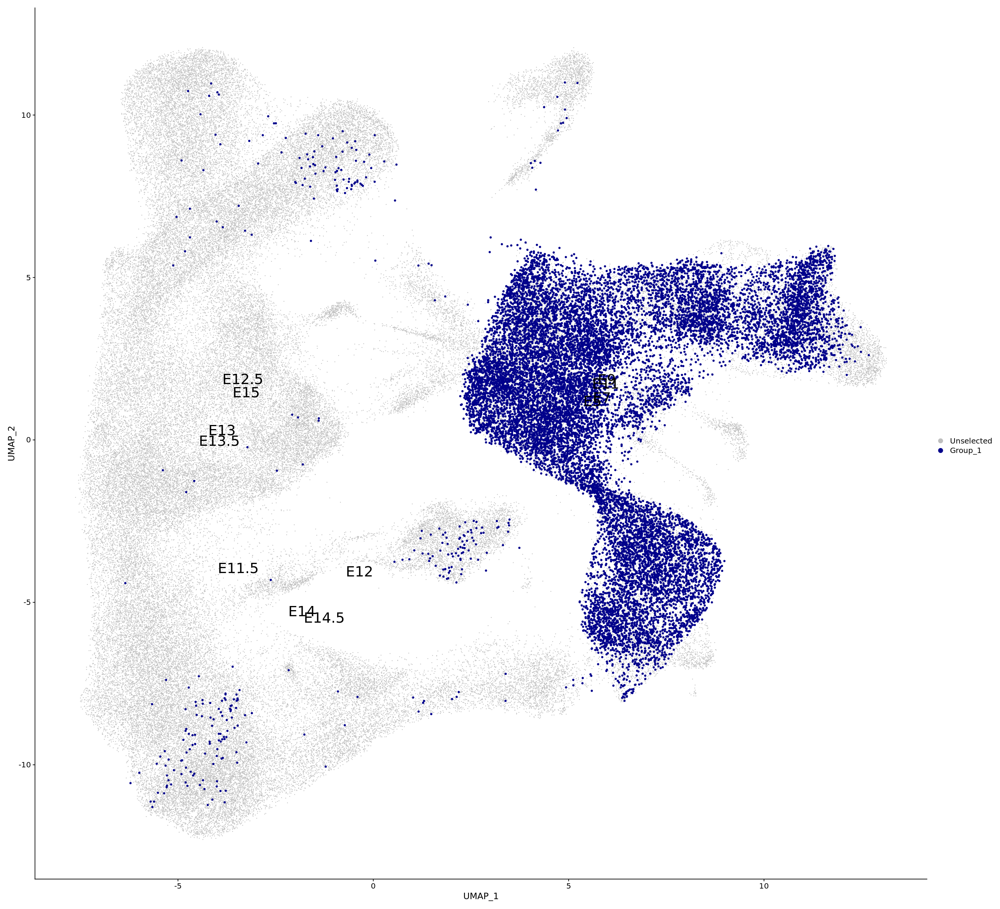

In [60]:
g1_untreat <- WhichCells(embryo.integrated, idents = c('E11'))
DimPlot(embryo.integrated, label=TRUE, cells.highlight= g1_untreat, cols.highlight = "darkblue", cols= "grey", label.size = 8, raster=FALSE)